In [1]:
import os

# Path to your dataset folder
dataset_path = "/kaggle/input/datasets/sayalis069/mh-weed16/MH-Weed16An Indian Multiclass Annotated Weed Dataset for Computer Vision Tasks/MH-Weed16/Individual Weed Species/16 Classes of Weed_Species/Individual Weed_Species"

# Dictionary to store counts
image_counts = {}

# Loop through each subfolder
for folder in os.listdir(dataset_path):
    folder_path = os.path.join(dataset_path, folder)
    if os.path.isdir(folder_path):
        count = len([
            f for f in os.listdir(folder_path)
            if f.lower().endswith(('.png', '.jpg', '.jpeg'))
        ])
        image_counts[folder] = count

# Print the results
for class_name, count in image_counts.items():
    print(f"{class_name}: {count} images")

# Total images
print(f"\nTotal images: {sum(image_counts.values())}")


11.Graceful_Sandmart_(Euphorbia hypericifolia): 262 images
4.Moti_dudhi(Euphorbia_geneculata_L): 3002 images
10.Gajar_gavat_(Parthenium hysterophorus): 1543 images
3.Little_Mallow(Malva parviflora): 2100 images
12.Sicklepod_(Senna obtusifolia): 643 images
13.Harali_(Cynodon_dactylon): 709 images
7.Bilayat_(Mexicana_Argemone): 859 images
2.Lamber_Quarter_plant(Chenopodium ): 836 images
8.Choti_dudhi_(Euphorbia_hirta): 580 images
6.Asian_Pigeonwings_(Clitoria Ternatea): 678 images
5.Obscure_morning _glory(Ipomoea obscura): 1637 images
0.Kena_(Commplina_benghalensio): 1704 images
1..Lavhala_(Cyperus_Rotundus): 1177 images
14.Dwarf_cassia_(Chamaecrista pumila): 1306 images
15.Punarnava _(Boerhaavia diffusa): 544 images
9.Digitaria_SP_(Digitaria Sanguinalis ): 1561 images

Total images: 19141


In [2]:
import pandas as pd

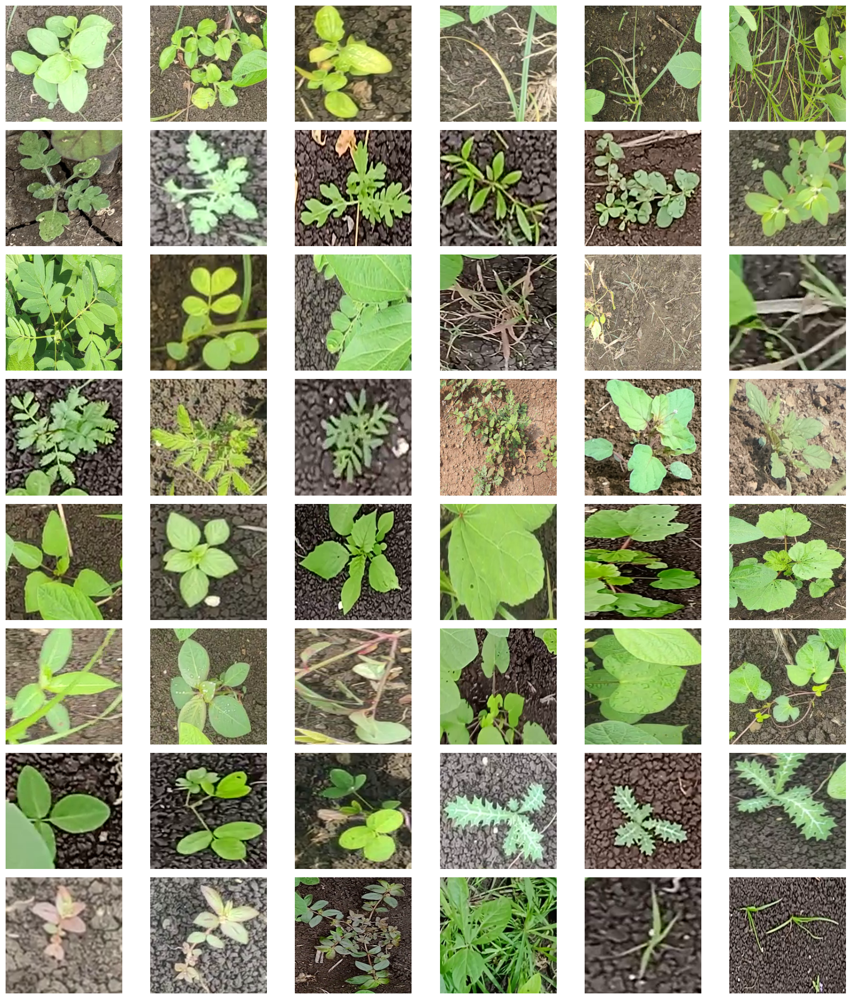

In [3]:
import os
import random
import matplotlib.pyplot as plt
import cv2

random.seed(42)

data_dir = "/kaggle/input/datasets/sayalis069/mh-weed16/MH-Weed16An Indian Multiclass Annotated Weed Dataset for Computer Vision Tasks/MH-Weed16/Individual Weed Species/16 Classes of Weed_Species/Individual Weed_Species"

class_names = sorted(os.listdir(data_dir))
samples_per_class = 3

images = []
labels = []

# Collect images first
for class_name in class_names:
    class_path = os.path.join(data_dir, class_name)
    image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.jpg','.jpeg','.png'))]

    sample_images = random.sample(image_files, min(samples_per_class, len(image_files)))

    for img_name in sample_images:
        img_path = os.path.join(class_path, img_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        images.append(img)
        labels.append(class_name[:15])

# Plot in compact grid
rows = 8
cols = 6

plt.figure(figsize=(16, 18))

for i in range(len(images)):
    plt.subplot(rows, cols, i+1)
    plt.imshow(images[i])
    plt.axis("off")

    if i % cols == 0:
        plt.ylabel(labels[i], fontsize=10)

plt.tight_layout()
plt.savefig("dataset_samples.png", dpi=300)
plt.show()

In [4]:
import os
import cv2
import numpy as np
from PIL import Image
from tqdm import tqdm

# --- Preprocessing functions ---
def load_and_resize_image(path, size=(224, 224)):
    img = Image.open(path).convert('RGB')
    img = img.resize(size)
    return img

def apply_clahe(img):
    img_np = np.array(img)
    lab = cv2.cvtColor(img_np, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    merged = cv2.merge((cl, a, b))
    clahe_img = cv2.cvtColor(merged, cv2.COLOR_LAB2RGB)
    return Image.fromarray(clahe_img)

def apply_unsharp_mask(img):
    img_np = np.array(img)
    blurred = cv2.GaussianBlur(img_np, (0, 0), sigmaX=3)
    sharpened = cv2.addWeighted(img_np, 1.5, blurred, -0.5, 0)
    return Image.fromarray(sharpened)

# --- Combined pipeline ---
def preprocess_and_save(input_root, output_root):
    os.makedirs(output_root, exist_ok=True)
    for class_name in os.listdir(input_root):
        class_input_path = os.path.join(input_root, class_name)
        class_output_path = os.path.join(output_root, class_name)
        os.makedirs(class_output_path, exist_ok=True)

        for fname in tqdm(os.listdir(class_input_path), desc=f"Processing {class_name}"):
            if not fname.lower().endswith(('.jpg', '.jpeg', '.png')):
                continue

            fpath = os.path.join(class_input_path, fname)

            img = load_and_resize_image(fpath)
            img = apply_clahe(img)
            img = apply_unsharp_mask(img)

            # ✅ Save without normalization
            img.save(os.path.join(class_output_path, fname))

# --- Paths for MH-Weed16 ---
input_path = "/kaggle/input/datasets/sayalis069/mh-weed16/MH-Weed16An Indian Multiclass Annotated Weed Dataset for Computer Vision Tasks/MH-Weed16/Individual Weed Species/16 Classes of Weed_Species/Individual Weed_Species"
output_path = "/kaggle/working/preprocessed_mhweed16"

# Preprocess and save
preprocess_and_save(input_path, output_path)

print("✅ Preprocessing complete! Saved to:", output_path)

Processing 11.Graceful_Sandmart_(Euphorbia hypericifolia): 100%|██████████| 262/262 [00:07<00:00, 33.86it/s]
Processing 4.Moti_dudhi(Euphorbia_geneculata_L): 100%|██████████| 3002/3002 [01:29<00:00, 33.55it/s]
Processing 10.Gajar_gavat_(Parthenium hysterophorus): 100%|██████████| 1543/1543 [01:02<00:00, 24.80it/s]
Processing 8.Choti_dudhi_(Euphorbia_hirta): 100%|██████████| 580/580 [00:16<00:00, 34.53it/s]
Processing 6.Asian_Pigeonwings_(Clitoria Ternatea): 100%|██████████| 678/678 [00:20<00:00, 33.87it/s]
Processing 5.Obscure_morning _glory(Ipomoea obscura): 100%|██████████| 1637/1637 [00:49<00:00, 32.94it/s]
Processing 15.Punarnava _(Boerhaavia diffusa): 100%|██████████| 544/544 [00:15<00:00, 36.00it/s]
Processing 9.Digitaria_SP_(Digitaria Sanguinalis ): 100%|██████████| 1561/1561 [00:45<00:00, 34.53it/s]

✅ Preprocessing complete! Saved to: /kaggle/working/preprocessed_mhweed16


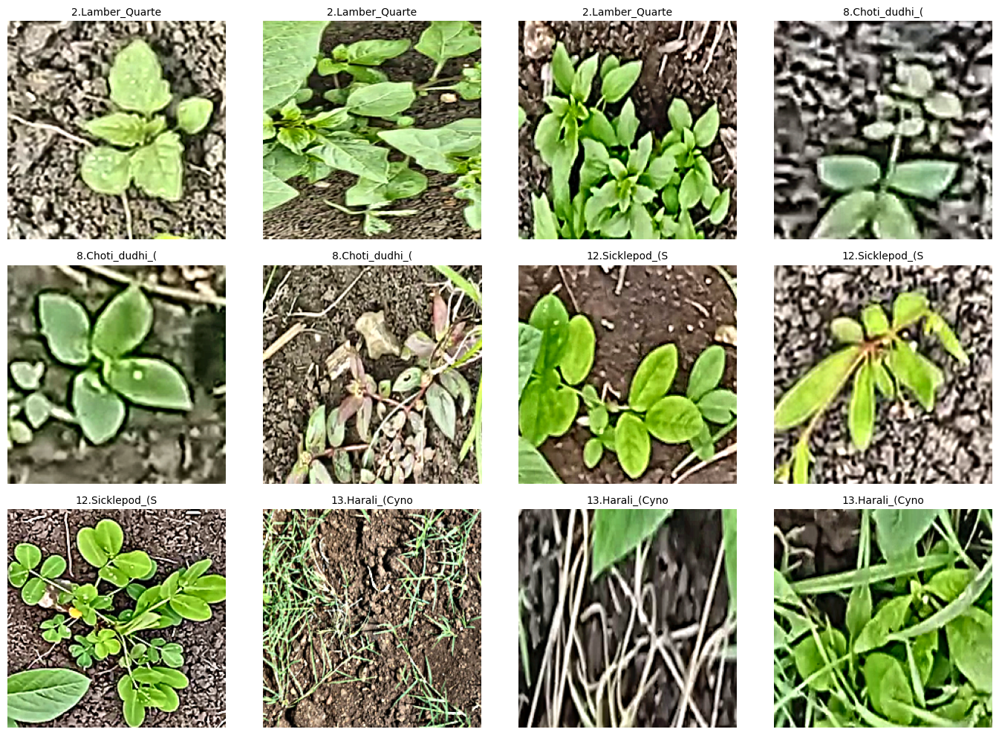

In [5]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

# Reproducibility
random.seed(42)

# Path to preprocessed dataset
dataset_path = "/kaggle/working/preprocessed_mhweed16"

# Pick class folders
class_folders = [
    os.path.join(dataset_path, c)
    for c in os.listdir(dataset_path)
    if os.path.isdir(os.path.join(dataset_path, c))
]

# Choose random images
sample_images = []
for class_folder in class_folders:
    images = [
        os.path.join(class_folder, f)
        for f in os.listdir(class_folder)
        if f.lower().endswith(('.jpg', '.jpeg', '.png'))
    ]
    if images:
        sample_images.extend(random.sample(images, min(3, len(images))))

# Plot
plt.figure(figsize=(14, 10))

for i, img_path in enumerate(sample_images[:12]):
    img = Image.open(img_path)

    plt.subplot(3, 4, i+1)
    plt.imshow(img)
    plt.axis("off")

    # Short class name
    plt.title(os.path.basename(os.path.dirname(img_path))[:15], fontsize=10)

plt.tight_layout()

# Save for paper
plt.savefig("preprocessed_samples.png", dpi=300)

plt.show()

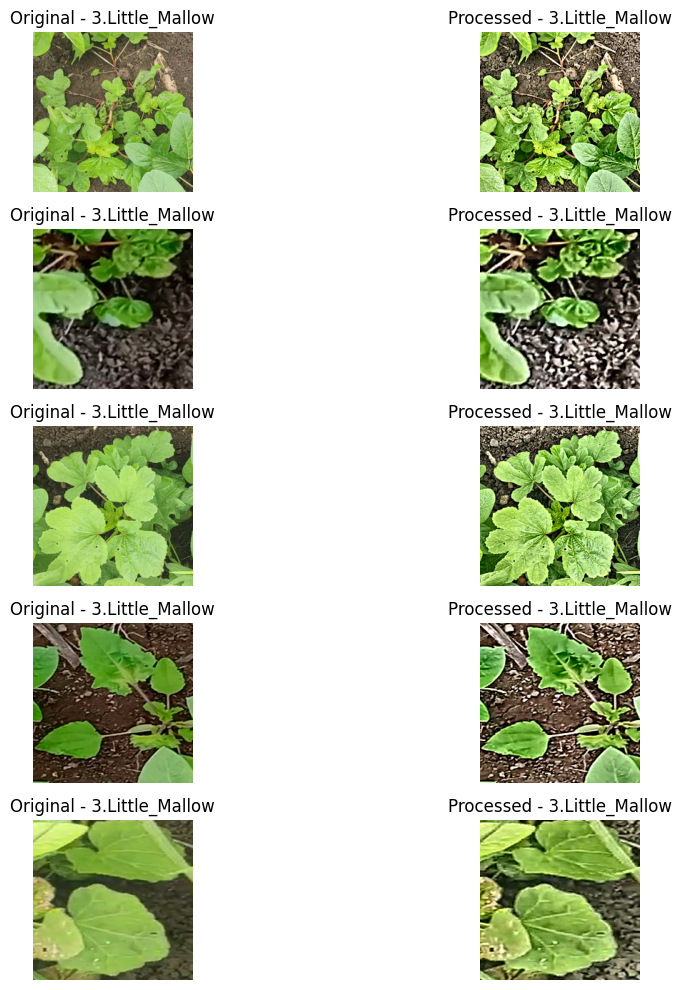

In [6]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

# Reproducibility
random.seed(42)

# Paths
original_path = "/kaggle/input/datasets/sayalis069/mh-weed16/MH-Weed16An Indian Multiclass Annotated Weed Dataset for Computer Vision Tasks/MH-Weed16/Individual Weed Species/16 Classes of Weed_Species/Individual Weed_Species"
processed_path = "/kaggle/working/preprocessed_mhweed16"

# Pick class folders
class_names = [
    c for c in os.listdir(original_path)
    if os.path.isdir(os.path.join(original_path, c))
]

# Choose random class
chosen_class = random.choice(class_names)

# Get image list
orig_images = [
    f for f in os.listdir(os.path.join(original_path, chosen_class))
    if f.lower().endswith(('.jpg', '.jpeg', '.png'))
]

sample_files = random.sample(orig_images, min(5, len(orig_images)))

# Plot
plt.figure(figsize=(12, len(sample_files)*2))

for i, file_name in enumerate(sample_files):
    # Original
    orig_img = Image.open(os.path.join(original_path, chosen_class, file_name))

    # Processed
    proc_img = Image.open(os.path.join(processed_path, chosen_class, file_name))

    # Original plot
    plt.subplot(len(sample_files), 2, i*2+1)
    plt.imshow(orig_img)
    plt.axis("off")
    plt.title(f"Original - {chosen_class[:15]}")

    # Processed plot
    plt.subplot(len(sample_files), 2, i*2+2)
    plt.imshow(proc_img)
    plt.axis("off")
    plt.title(f"Processed - {chosen_class[:15]}")

plt.tight_layout()

# Save for paper
plt.savefig("preprocessing_comparison.png", dpi=300)

plt.show()

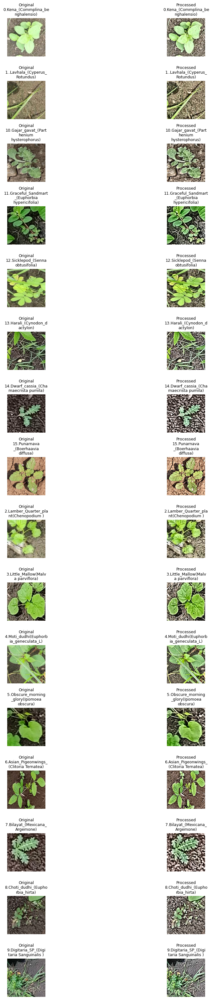

In [7]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image
import textwrap

# Reproducibility
random.seed(42)

# Paths
original_path = "/kaggle/input/datasets/sayalis069/mh-weed16/MH-Weed16An Indian Multiclass Annotated Weed Dataset for Computer Vision Tasks/MH-Weed16/Individual Weed Species/16 Classes of Weed_Species/Individual Weed_Species"
processed_path = "/kaggle/working/preprocessed_mhweed16"

# Get class names
class_names = [c for c in os.listdir(original_path) if os.path.isdir(os.path.join(original_path, c))]
class_names.sort()

# Plot
plt.figure(figsize=(14, len(class_names) * 2))

for i, chosen_class in enumerate(class_names):
    orig_images = [
        f for f in os.listdir(os.path.join(original_path, chosen_class))
        if f.lower().endswith(('.jpg', '.jpeg', '.png'))
    ]
    if not orig_images:
        continue

    file_name = random.choice(orig_images)

    # Load images
    orig_img = Image.open(os.path.join(original_path, chosen_class, file_name))
    proc_img = Image.open(os.path.join(processed_path, chosen_class, file_name))

    wrapped_title = "\n".join(textwrap.wrap(chosen_class, width=20))

    # Original
    plt.subplot(len(class_names), 2, i*2 + 1)
    plt.imshow(orig_img)
    plt.axis("off")
    plt.title(f"Original\n{wrapped_title}", fontsize=9)

    # Processed
    plt.subplot(len(class_names), 2, i*2 + 2)
    plt.imshow(proc_img)
    plt.axis("off")
    plt.title(f"Processed\n{wrapped_title}", fontsize=9)

plt.tight_layout()

# Save for paper
plt.savefig("all_classes_preprocessing.png", dpi=300)

plt.show()

In [8]:
import os
import shutil
import random

# ✅ Reproducibility
random.seed(42)

original_path = "/kaggle/working/preprocessed_mhweed16"
output_base = "/kaggle/working/split_dataset"

ratios = [0.7, 0.15, 0.15]

for cls in os.listdir(original_path):
    cls_path = os.path.join(original_path, cls)
    if not os.path.isdir(cls_path):
        continue

    images = [
        f for f in os.listdir(cls_path)
        if f.lower().endswith(('.jpg', '.jpeg', '.png'))
    ]

    random.shuffle(images)

    total = len(images)
    train_end = int(ratios[0] * total)
    val_end = train_end + int(ratios[1] * total)

    split_data = {
        "train": images[:train_end],
        "val": images[train_end:val_end],
        "test": images[val_end:]
    }

    for split, files in split_data.items():
        split_folder = os.path.join(output_base, split, cls)
        os.makedirs(split_folder, exist_ok=True)

        for file in files:
            shutil.copy2(
                os.path.join(cls_path, file),
                os.path.join(split_folder, file)
            )

In [9]:
import os

# ✅ DEFINE PATH (same as your split cell)
split_dataset_path = "/kaggle/working/split_dataset"

# Count function
def count_images_per_class(split_path):
    counts = {}
    for class_name in sorted(os.listdir(split_path)):
        class_dir = os.path.join(split_path, class_name)
        if os.path.isdir(class_dir):
            counts[class_name] = len(os.listdir(class_dir))
    return counts

# Count images
train_counts = count_images_per_class(os.path.join(split_dataset_path, "train"))
val_counts = count_images_per_class(os.path.join(split_dataset_path, "val"))
test_counts = count_images_per_class(os.path.join(split_dataset_path, "test"))

# Print counts
print("Train set counts:", train_counts)
print("Validation set counts:", val_counts)
print("Test set counts:", test_counts)

# Totals
print("\nTotal train images:", sum(train_counts.values()))
print("Total validation images:", sum(val_counts.values()))
print("Total test images:", sum(test_counts.values()))

Train set counts: {'0.Kena_(Commplina_benghalensio)': 1192, '1..Lavhala_(Cyperus_Rotundus)': 823, '10.Gajar_gavat_(Parthenium hysterophorus)': 1080, '11.Graceful_Sandmart_(Euphorbia hypericifolia)': 183, '12.Sicklepod_(Senna obtusifolia)': 450, '13.Harali_(Cynodon_dactylon)': 496, '14.Dwarf_cassia_(Chamaecrista pumila)': 914, '15.Punarnava _(Boerhaavia diffusa)': 380, '2.Lamber_Quarter_plant(Chenopodium )': 585, '3.Little_Mallow(Malva parviflora)': 1470, '4.Moti_dudhi(Euphorbia_geneculata_L)': 2101, '5.Obscure_morning _glory(Ipomoea obscura)': 1145, '6.Asian_Pigeonwings_(Clitoria Ternatea)': 474, '7.Bilayat_(Mexicana_Argemone)': 601, '8.Choti_dudhi_(Euphorbia_hirta)': 406, '9.Digitaria_SP_(Digitaria Sanguinalis )': 1092}
Validation set counts: {'0.Kena_(Commplina_benghalensio)': 255, '1..Lavhala_(Cyperus_Rotundus)': 176, '10.Gajar_gavat_(Parthenium hysterophorus)': 231, '11.Graceful_Sandmart_(Euphorbia hypericifolia)': 39, '12.Sicklepod_(Senna obtusifolia)': 96, '13.Harali_(Cynodon_dac

In [10]:
import pandas as pd

classes = sorted(set(train_counts.keys()) | set(val_counts.keys()) | set(test_counts.keys()))

df_counts = pd.DataFrame({
    "Class": classes,
    "Train": [train_counts.get(c, 0) for c in classes],
    "Validation": [val_counts.get(c, 0) for c in classes],
    "Test": [test_counts.get(c, 0) for c in classes],
})

# Shorten class names (optional)
df_counts["Class"] = df_counts["Class"].str[:25]

# Add total row
df_counts.loc["Total"] = ["Total", df_counts["Train"].sum(), df_counts["Validation"].sum(), df_counts["Test"].sum()]

print(df_counts.to_string(index=False))

# Save for paper
df_counts.to_csv("dataset_split_summary.csv", index=False)

                    Class  Train  Validation  Test
0.Kena_(Commplina_benghal   1192         255   257
1..Lavhala_(Cyperus_Rotun    823         176   178
10.Gajar_gavat_(Partheniu   1080         231   232
11.Graceful_Sandmart_(Eup    183          39    40
12.Sicklepod_(Senna obtus    450          96    97
13.Harali_(Cynodon_dactyl    496         106   107
14.Dwarf_cassia_(Chamaecr    914         195   197
15.Punarnava _(Boerhaavia    380          81    83
2.Lamber_Quarter_plant(Ch    585         125   126
3.Little_Mallow(Malva par   1470         315   315
4.Moti_dudhi(Euphorbia_ge   2101         450   451
5.Obscure_morning _glory(   1145         245   247
6.Asian_Pigeonwings_(Clit    474         101   103
7.Bilayat_(Mexicana_Argem    601         128   130
8.Choti_dudhi_(Euphorbia_    406          87    87
9.Digitaria_SP_(Digitaria   1092         234   235
                    Total  13392        2864  2885


In [11]:
import os

base_path = "/kaggle/working/split_dataset"

for split in ["train", "val", "test"]:
    split_path = os.path.join(base_path, split)

    counts = {
        cls: len(os.listdir(os.path.join(split_path, cls)))
        for cls in os.listdir(split_path)
        if os.path.isdir(os.path.join(split_path, cls))
    }

    print(f"\n{split.upper()} set distribution:")

    for cls in sorted(counts):
        print(f"{cls}: {counts[cls]}")

    print(f"Total: {sum(counts.values())}")


TRAIN set distribution:
0.Kena_(Commplina_benghalensio): 1192
1..Lavhala_(Cyperus_Rotundus): 823
10.Gajar_gavat_(Parthenium hysterophorus): 1080
11.Graceful_Sandmart_(Euphorbia hypericifolia): 183
12.Sicklepod_(Senna obtusifolia): 450
13.Harali_(Cynodon_dactylon): 496
14.Dwarf_cassia_(Chamaecrista pumila): 914
15.Punarnava _(Boerhaavia diffusa): 380
2.Lamber_Quarter_plant(Chenopodium ): 585
3.Little_Mallow(Malva parviflora): 1470
4.Moti_dudhi(Euphorbia_geneculata_L): 2101
5.Obscure_morning _glory(Ipomoea obscura): 1145
6.Asian_Pigeonwings_(Clitoria Ternatea): 474
7.Bilayat_(Mexicana_Argemone): 601
8.Choti_dudhi_(Euphorbia_hirta): 406
9.Digitaria_SP_(Digitaria Sanguinalis ): 1092
Total: 13392

VAL set distribution:
0.Kena_(Commplina_benghalensio): 255
1..Lavhala_(Cyperus_Rotundus): 176
10.Gajar_gavat_(Parthenium hysterophorus): 231
11.Graceful_Sandmart_(Euphorbia hypericifolia): 39
12.Sicklepod_(Senna obtusifolia): 96
13.Harali_(Cynodon_dactylon): 106
14.Dwarf_cassia_(Chamaecrista pumi

In [12]:
train_counts = {
    "9.Digitaria_SP_(Digitaria Sanguinalis )": 1092,
    "11.Graceful_Sandmart_(Euphorbia hypericifolia)": 183,
    "4.Moti_dudhi(Euphorbia_geneculata_L)": 2101,
    "13.Harali_(Cynodon_dactylon)": 496,
    "6.Asian_Pigeonwings_(Clitoria Ternatea)": 474,
    "8.Choti_dudhi_(Euphorbia_hirta)": 406,
    "3.Little_Mallow(Malva parviflora)": 1470,
    "10.Gajar_gavat_(Parthenium hysterophorus)": 1080,
    "14.Dwarf_cassia_(Chamaecrista pumila)": 914,
    "2.Lamber_Quarter_plant(Chenopodium )": 585,
    "5.Obscure_morning _glory(Ipomoea obscura)": 1145,
    "7.Bilayat_(Mexicana_Argemone)": 601,
    "15.Punarnava _(Boerhaavia diffusa)": 380,
    "1..Lavhala_(Cyperus_Rotundus)": 823,
    "0.Kena_(Commplina_benghalensio)": 1192,
    "12.Sicklepod_(Senna obtusifolia)": 450
}

max_count = max(train_counts.values())
print("Max class size:", max_count)  # 2101
print("Min class size:", min(train_counts.values()))


Max class size: 2101
Min class size: 183


In [13]:
import os

# ✅ Use TRAIN folder only
root_dir = "/kaggle/working/split_dataset/train"

def count_images(folder):
    return len([
        f for f in os.listdir(folder)
        if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tif', '.tiff'))
    ])

class_counts = {}

for class_name in os.listdir(root_dir):
    class_path = os.path.join(root_dir, class_name)

    if os.path.isdir(class_path):
        class_counts[class_name] = count_images(class_path)

print("Train set image count per class:")
for cls, cnt in sorted(class_counts.items()):
    print(f"{cls}: {cnt}")

print(f"\nTotal train images: {sum(class_counts.values())}")

Train set image count per class:
0.Kena_(Commplina_benghalensio): 1192
1..Lavhala_(Cyperus_Rotundus): 823
10.Gajar_gavat_(Parthenium hysterophorus): 1080
11.Graceful_Sandmart_(Euphorbia hypericifolia): 183
12.Sicklepod_(Senna obtusifolia): 450
13.Harali_(Cynodon_dactylon): 496
14.Dwarf_cassia_(Chamaecrista pumila): 914
15.Punarnava _(Boerhaavia diffusa): 380
2.Lamber_Quarter_plant(Chenopodium ): 585
3.Little_Mallow(Malva parviflora): 1470
4.Moti_dudhi(Euphorbia_geneculata_L): 2101
5.Obscure_morning _glory(Ipomoea obscura): 1145
6.Asian_Pigeonwings_(Clitoria Ternatea): 474
7.Bilayat_(Mexicana_Argemone): 601
8.Choti_dudhi_(Euphorbia_hirta): 406
9.Digitaria_SP_(Digitaria Sanguinalis ): 1092

Total train images: 13392


In [14]:
from torchvision import transforms, datasets
from torch.utils.data import DataLoader

# =========================
# TRAIN TRANSFORMS
# =========================
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(45),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomAffine(
        degrees=0,
        translate=(0.3, 0.3),
        shear=0.25
    ),
    transforms.ColorJitter(brightness=(0.2, 0.9)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# =========================
# VAL & TEST TRANSFORMS
# =========================
val_test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# =========================
# DATASETS
# =========================
train_dataset = datasets.ImageFolder(
    "/kaggle/working/split_dataset/train",
    transform=train_transform
)

val_dataset = datasets.ImageFolder(
    "/kaggle/working/split_dataset/val",
    transform=val_test_transform
)

test_dataset = datasets.ImageFolder(
    "/kaggle/working/split_dataset/test",
    transform=val_test_transform
)

# =========================
# DATALOADERS
# =========================
train_loader = DataLoader(
    train_dataset,
    batch_size=32,
    shuffle=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=32,
    shuffle=False
)

test_loader = DataLoader(
    test_dataset,
    batch_size=32,
    shuffle=False
)

In [15]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# =========================
# Conv Block
# =========================
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(out_channels)

        self.conv2 = nn.Conv2d(out_channels, out_channels, 3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_channels)

        self.shortcut = nn.Conv2d(in_channels, out_channels, 1) if in_channels != out_channels else nn.Identity()

    def forward(self, x):
        shortcut = self.shortcut(x)

        x = F.relu(self.bn1(self.conv1(x)))
        x = self.bn2(self.conv2(x))

        x = x + shortcut
        return F.relu(x)


# =========================
# SE Block
# =========================
class SEBlock(nn.Module):
    def __init__(self, channels, reduction=8):
        super().__init__()
        self.fc1 = nn.Linear(channels, channels // reduction)
        self.fc2 = nn.Linear(channels // reduction, channels)

    def forward(self, x):
        b, c, h, w = x.size()

        y = x.mean(dim=(2, 3))
        y = F.relu(self.fc1(y))
        y = torch.sigmoid(self.fc2(y)).view(b, c, 1, 1)

        return x * y


# =========================
# Transformer Encoder
# =========================
class TransformerEncoder(nn.Module):
    def __init__(self, dim=128, heads=4, ff_dim=128):
        super().__init__()
        self.norm1 = nn.LayerNorm(dim)
        self.attn = nn.MultiheadAttention(dim, heads, batch_first=True)

        self.norm2 = nn.LayerNorm(dim)
        self.ff = nn.Sequential(
            nn.Linear(dim, ff_dim),
            nn.ReLU(),
            nn.Linear(ff_dim, dim)
        )

    def forward(self, x):
        x = x + self.attn(self.norm1(x), self.norm1(x), self.norm1(x))[0]
        x = x + self.ff(self.norm2(x))
        return x


# =========================
# FINAL MODEL
# =========================
class CNN_SE_Transformer(nn.Module):
    def __init__(self, num_classes=16):
        super().__init__()

        self.conv1 = ConvBlock(3, 32)
        self.pool1 = nn.MaxPool2d(2)
        self.se1 = SEBlock(32)

        self.conv2 = ConvBlock(32, 64)
        self.pool2 = nn.MaxPool2d(2)
        self.se2 = SEBlock(64)

        self.conv3 = ConvBlock(64, 128)
        self.pool3 = nn.MaxPool2d(2)
        self.se3 = SEBlock(128)

        self.patch = nn.Conv2d(128, 128, 3, stride=2, padding=1)

        self.transformer1 = TransformerEncoder()
        self.transformer2 = TransformerEncoder()

        self.dropout = nn.Dropout(0.4)
        self.fc = nn.Linear(128, num_classes)

    def forward(self, x):
        x = self.pool1(self.se1(self.conv1(x)))
        x = self.pool2(self.se2(self.conv2(x)))
        x = self.pool3(self.se3(self.conv3(x)))

        x = self.patch(x)

        b, c, h, w = x.shape
        x = x.view(b, c, h*w).permute(0, 2, 1)

        x = self.transformer1(x)
        x = self.transformer2(x)

        x = x.mean(dim=1)
        x = self.dropout(x)

        return self.fc(x)


# =========================
# BUILD MODEL
# =========================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = CNN_SE_Transformer(num_classes=16).to(device)

print(model)

CNN_SE_Transformer(
  (conv1): ConvBlock(
    (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (shortcut): Conv2d(3, 32, kernel_size=(1, 1), stride=(1, 1))
  )
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (se1): SEBlock(
    (fc1): Linear(in_features=32, out_features=4, bias=True)
    (fc2): Linear(in_features=4, out_features=32, bias=True)
  )
  (conv2): ConvBlock(
    (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.

In [16]:
import numpy as np
import torch
from sklearn.utils.class_weight import compute_class_weight

# Get labels from dataset
targets = train_dataset.targets

# Compute class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(targets),
    y=targets
)

# Convert to tensor
class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)

print("Class Weights:", class_weights)

Class Weights: tensor([0.7022, 1.0170, 0.7750, 4.5738, 1.8600, 1.6875, 0.9158, 2.2026, 1.4308,
        0.5694, 0.3984, 0.7310, 1.7658, 1.3927, 2.0616, 0.7665],
       device='cuda:0')


In [17]:
import os
import torch
import numpy as np
import pandas as pd
import copy
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# =========================
# TRAIN FUNCTION
# =========================
def train_one_epoch(model, loader, criterion, optimizer):
    model.train()
    total_loss, correct, total = 0, 0, 0

    loop = tqdm(loader, desc="Train", leave=False)

    for images, labels in loop:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)

        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        preds = outputs.argmax(1)

        correct += (preds == labels).sum().item()
        total += labels.size(0)

        loop.set_postfix(
            loss=total_loss / (total + 1e-8),
            acc=correct / total
        )

    return total_loss / len(loader), correct / total

# =========================
# EVALUATE FUNCTION
# =========================
def evaluate(model, loader, criterion):
    model.eval()
    total_loss, correct, total = 0, 0, 0
    all_preds, all_labels, all_probs = [], [], []

    loop = tqdm(loader, desc="Val/Test", leave=False)

    with torch.no_grad():
        for images, labels in loop:
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)

            loss = criterion(outputs, labels)

            total_loss += loss.item()
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

            correct += (preds == labels).sum().item()
            total += labels.size(0)

            loop.set_postfix(
                loss=total_loss / (total + 1e-8),
                acc=correct / total
            )

    return total_loss/len(loader), correct/total, np.array(all_preds), np.array(all_labels), np.array(all_probs)
# =========================
# MAIN EXPERIMENT FUNCTION
# =========================
def run_experiment(name, optimizer_type="adam", label_smoothing=0.0, runs=3, epochs=60):

    base_dir = f"/kaggle/working/experiments_{name}"
    os.makedirs(base_dir, exist_ok=True)

    results = []

    for run in range(1, runs+1):

        print(f"\n===== {name} | RUN {run} =====")

        run_dir = os.path.join(base_dir, f"run_{run}")
        os.makedirs(run_dir, exist_ok=True)

        model = CNN_SE_Transformer(num_classes=16).to(device)

        # LOSS
        criterion = torch.nn.CrossEntropyLoss(
            weight=class_weights,
            label_smoothing=label_smoothing
        )

        # OPTIMIZER
        if optimizer_type == "adam":
            optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
        elif optimizer_type == "rmsprop":
            optimizer = torch.optim.RMSprop(model.parameters(), lr=1e-4)

        # LR Scheduler
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode='min', factor=0.3, patience=3
        )

        best_loss = float('inf')
        history = []

        # Early stopping
        patience = 5
        patience_counter = 0

        # =========================
        # TRAIN LOOP
        # =========================
        for epoch in range(epochs):

            train_loss, train_acc = train_one_epoch(model, train_loader, criterion, optimizer)
            val_loss, val_acc, _, _, _ = evaluate(model, val_loader, criterion)

            scheduler.step(val_loss)

            print(f"Epoch {epoch+1}: TL={train_loss:.4f}, TA={train_acc:.4f}, VL={val_loss:.4f}, VA={val_acc:.4f}")

            history.append([epoch+1, train_loss, train_acc, val_loss, val_acc])

            # Save best model
            if val_loss < best_loss:
                best_loss = val_loss
                best_weights = copy.deepcopy(model.state_dict())
                torch.save(best_weights, os.path.join(run_dir, "model.pth"))
                patience_counter = 0
            else:
                patience_counter += 1

            # Early stopping
            if patience_counter >= patience:
                print(f"⏹ Early stopping at epoch {epoch+1}")
                break

        # Load best model
        model.load_state_dict(best_weights)

        # =========================
        # TEST
        # =========================
        test_loss, test_acc, preds, labels, probs = evaluate(model, test_loader, criterion)

        print(f"\n✅ Test Accuracy: {test_acc:.4f}")
        print(f"✅ Test Loss: {test_loss:.4f}")

        # =========================
        # SAVE FILES
        # =========================
        pd.DataFrame(history, columns=["epoch","train_loss","train_acc","val_loss","val_acc"])\
            .to_csv(os.path.join(run_dir, "history.csv"), index=False)

        np.save(os.path.join(run_dir, "predictions.npy"), preds)
        np.save(os.path.join(run_dir, "labels.npy"), labels)
        np.save(os.path.join(run_dir, "probs.npy"), probs)

        with open(os.path.join(run_dir, "results.txt"), "w") as f:
            f.write(f"Test Accuracy: {test_acc}\nTest Loss: {test_loss}")

        results.append(test_acc)

    # =========================
    # FINAL STATS
    # =========================
    results = np.array(results)

    print("\n📊 FINAL RESULTS")
    print(f"Mean Accuracy: {results.mean():.4f}")
    print(f"Std Accuracy: {results.std():.4f}")

    return results

In [40]:
# Adam
adam_results = run_experiment(
    name="adam",
    optimizer_type="adam",
    label_smoothing=0.0
)



===== adam | RUN 1 =====


Epoch 1: TL=2.1734, TA=0.2656, VL=1.9303, VA=0.3488


Epoch 2: TL=1.7342, TA=0.3952, VL=1.8962, VA=0.3575


Epoch 3: TL=1.5644, TA=0.4559, VL=1.5715, VA=0.4724


Epoch 4: TL=1.4470, TA=0.5005, VL=1.3775, VA=0.5276


Epoch 5: TL=1.3267, TA=0.5389, VL=1.6079, VA=0.4602


Epoch 6: TL=1.2465, TA=0.5611, VL=1.3985, VA=0.5262


Epoch 7: TL=1.1727, TA=0.5886, VL=1.1824, VA=0.6054


Epoch 8: TL=1.1029, TA=0.6092, VL=1.1916, VA=0.5988


Epoch 9: TL=1.0600, TA=0.6326, VL=1.0960, VA=0.6208


Epoch 10: TL=1.0339, TA=0.6331, VL=0.9859, VA=0.6711


Epoch 11: TL=0.9554, TA=0.6633, VL=0.9903, VA=0.6648


Epoch 12: TL=0.9192, TA=0.6736, VL=1.2212, VA=0.6006


Epoch 13: TL=0.8900, TA=0.6881, VL=0.9545, VA=0.6861


Epoch 14: TL=0.8425, TA=0.7012, VL=1.1413, VA=0.6226


Epoch 15: TL=0.8262, TA=0.7090, VL=0.9141, VA=0.6955


Epoch 16: TL=0.7997, TA=0.7164, VL=0.8221, VA=0.7277


Epoch 17: TL=0.7771, TA=0.7243, VL=0.8542, VA=0.7137


Epoch 18: TL=0.7459, TA=0.7403, VL=0.7375, VA=0.7465


Epoch 19: TL=0.7286, TA=0.7448, VL=0.7929, VA=0.7336


Epoch 20: TL=0.7080, TA=0.7509, VL=0.8788, VA=0.7067


Epoch 21: TL=0.6928, TA=0.7572, VL=0.7587, VA=0.7385


Epoch 22: TL=0.6618, TA=0.7634, VL=0.7198, VA=0.7643


Epoch 23: TL=0.6438, TA=0.7684, VL=0.6838, VA=0.7730


Epoch 24: TL=0.6311, TA=0.7755, VL=0.6992, VA=0.7657


Epoch 25: TL=0.6181, TA=0.7823, VL=0.6657, VA=0.7797


Epoch 26: TL=0.6134, TA=0.7836, VL=0.7885, VA=0.7304


Epoch 27: TL=0.5954, TA=0.7873, VL=0.7569, VA=0.7462


Epoch 28: TL=0.5745, TA=0.7952, VL=0.6553, VA=0.7779


Epoch 29: TL=0.5618, TA=0.8017, VL=0.6687, VA=0.7744


Epoch 30: TL=0.5511, TA=0.8073, VL=0.6266, VA=0.7989


Epoch 31: TL=0.5408, TA=0.8107, VL=0.7073, VA=0.7643


Epoch 32: TL=0.5389, TA=0.8094, VL=0.6397, VA=0.7832


Epoch 33: TL=0.5155, TA=0.8157, VL=0.6540, VA=0.7790


Epoch 34: TL=0.5105, TA=0.8177, VL=0.5982, VA=0.8101


Epoch 35: TL=0.4989, TA=0.8224, VL=0.6089, VA=0.7926


Epoch 36: TL=0.4734, TA=0.8330, VL=0.5908, VA=0.8094


Epoch 37: TL=0.4883, TA=0.8284, VL=0.5473, VA=0.8216


Epoch 38: TL=0.4795, TA=0.8303, VL=0.6321, VA=0.7814


Epoch 39: TL=0.4693, TA=0.8347, VL=0.5738, VA=0.8013


Epoch 40: TL=0.4521, TA=0.8386, VL=0.5581, VA=0.8163


Epoch 41: TL=0.4566, TA=0.8345, VL=0.5401, VA=0.8184


Epoch 42: TL=0.4400, TA=0.8397, VL=0.5323, VA=0.8156


Epoch 43: TL=0.4365, TA=0.8462, VL=0.5310, VA=0.8272


Epoch 44: TL=0.4270, TA=0.8475, VL=0.5577, VA=0.8181


Epoch 45: TL=0.4189, TA=0.8472, VL=0.5187, VA=0.8296


Epoch 46: TL=0.4145, TA=0.8544, VL=0.5167, VA=0.8268


Epoch 47: TL=0.4056, TA=0.8537, VL=0.6551, VA=0.7919


Epoch 48: TL=0.4038, TA=0.8548, VL=0.5879, VA=0.8055


Epoch 49: TL=0.3896, TA=0.8601, VL=0.5779, VA=0.8139


Epoch 50: TL=0.3839, TA=0.8611, VL=0.5325, VA=0.8265


Epoch 51: TL=0.3094, TA=0.8860, VL=0.4499, VA=0.8471


Epoch 52: TL=0.2960, TA=0.8893, VL=0.4333, VA=0.8568


Epoch 53: TL=0.2897, TA=0.8896, VL=0.4389, VA=0.8589


Epoch 54: TL=0.2824, TA=0.8940, VL=0.4285, VA=0.8614


Epoch 55: TL=0.2915, TA=0.8928, VL=0.4100, VA=0.8628


Epoch 56: TL=0.2822, TA=0.8942, VL=0.4264, VA=0.8600


Epoch 57: TL=0.2789, TA=0.8958, VL=0.4430, VA=0.8547


Epoch 58: TL=0.2779, TA=0.8944, VL=0.4417, VA=0.8534


Epoch 59: TL=0.2789, TA=0.8991, VL=0.4300, VA=0.8551


Epoch 60: TL=0.2513, TA=0.9060, VL=0.4060, VA=0.8656



✅ Test Accuracy: 0.8666
✅ Test Loss: 0.4244

===== adam | RUN 2 =====


Epoch 1: TL=2.1758, TA=0.2557, VL=2.0301, VA=0.3314


Epoch 2: TL=1.7729, TA=0.3825, VL=1.8891, VA=0.3530


Epoch 3: TL=1.6067, TA=0.4385, VL=1.6513, VA=0.4131


KeyboardInterrupt: 

In [ ]:
# Adam + Label Smoothing
adam_ls_results = run_experiment(
    name="adam_ls",
    optimizer_type="adam",
    label_smoothing=0.05
)



===== adam_ls | RUN 1 =====


Epoch 1: TL=2.3277, TA=0.2568, VL=2.2797, VA=0.3034


Epoch 2: TL=1.9616, TA=0.3798, VL=2.1218, VA=0.3631


Epoch 3: TL=1.8007, TA=0.4532, VL=1.8345, VA=0.5007


Epoch 4: TL=1.6734, TA=0.5061, VL=1.7763, VA=0.5209


Epoch 5: TL=1.5944, TA=0.5360, VL=1.6989, VA=0.5468


Epoch 6: TL=1.5255, TA=0.5651, VL=1.7977, VA=0.4927


Epoch 7: TL=1.4602, TA=0.5925, VL=1.6439, VA=0.5702


Epoch 8: TL=1.4008, TA=0.6194, VL=1.6453, VA=0.5719


Epoch 9: TL=1.3368, TA=0.6407, VL=1.5960, VA=0.5890


Epoch 10: TL=1.2927, TA=0.6593, VL=1.4515, VA=0.6463


Epoch 11: TL=1.2722, TA=0.6664, VL=1.5700, VA=0.5981


Epoch 12: TL=1.2342, TA=0.6824, VL=1.3724, VA=0.6760


Epoch 13: TL=1.1869, TA=0.6986, VL=1.4643, VA=0.6351


Epoch 14: TL=1.1699, TA=0.7068, VL=1.3771, VA=0.6917


Epoch 15: TL=1.1422, TA=0.7200, VL=1.5040, VA=0.6198


Epoch 16: TL=1.1230, TA=0.7273, VL=1.3284, VA=0.6934


Epoch 17: TL=1.0922, TA=0.7371, VL=1.2638, VA=0.7249


Epoch 18: TL=1.0722, TA=0.7479, VL=1.2227, VA=0.7374


Epoch 19: TL=1.0522, TA=0.7563, VL=1.4190, VA=0.6435


Epoch 20: TL=1.0381, TA=0.7561, VL=1.1889, VA=0.7538


Epoch 21: TL=1.0292, TA=0.7649, VL=1.2298, VA=0.7371


Epoch 22: TL=1.0106, TA=0.7720, VL=1.1745, VA=0.7594


Epoch 23: TL=0.9872, TA=0.7784, VL=1.1979, VA=0.7559


Epoch 24: TL=0.9787, TA=0.7848, VL=1.1934, VA=0.7594


Epoch 25: TL=0.9745, TA=0.7841, VL=1.1726, VA=0.7699


Epoch 26: TL=0.9529, TA=0.7970, VL=1.1162, VA=0.7909


Epoch 27: TL=0.9366, TA=0.8005, VL=1.1820, VA=0.7598


Epoch 28: TL=0.9277, TA=0.8023, VL=1.1058, VA=0.7961


Epoch 29: TL=0.9114, TA=0.8084, VL=1.1223, VA=0.7835


Epoch 30: TL=0.9032, TA=0.8171, VL=1.1069, VA=0.7839


Epoch 31: TL=0.9051, TA=0.8140, VL=1.0887, VA=0.7888


Epoch 32: TL=0.8855, TA=0.8248, VL=1.0543, VA=0.8115


Epoch 33: TL=0.8786, TA=0.8293, VL=1.0672, VA=0.8010


Epoch 34: TL=0.8709, TA=0.8285, VL=1.0282, VA=0.8174


Epoch 35: TL=0.8663, TA=0.8333, VL=1.1593, VA=0.7640


Epoch 36: TL=0.8586, TA=0.8288, VL=1.1025, VA=0.7912


Epoch 37: TL=0.8494, TA=0.8361, VL=1.0197, VA=0.8226


Epoch 38: TL=0.8446, TA=0.8403, VL=1.1073, VA=0.7922


Epoch 39: TL=0.8323, TA=0.8456, VL=1.0347, VA=0.8209


Epoch 40: TL=0.8229, TA=0.8471, VL=1.0066, VA=0.8268


Epoch 41: TL=0.8199, TA=0.8500, VL=1.0598, VA=0.8083


Epoch 42: TL=0.8118, TA=0.8564, VL=1.0103, VA=0.8321


Epoch 43: TL=0.8183, TA=0.8494, VL=0.9837, VA=0.8432


Epoch 44: TL=0.8031, TA=0.8554, VL=0.9983, VA=0.8376


Epoch 45: TL=0.7951, TA=0.8597, VL=0.9787, VA=0.8401


Epoch 46: TL=0.7883, TA=0.8622, VL=1.0093, VA=0.8275


Epoch 47: TL=0.7890, TA=0.8609, VL=1.0434, VA=0.8076


Epoch 48: TL=0.7731, TA=0.8718, VL=1.0384, VA=0.8233


Epoch 49: TL=0.7743, TA=0.8648, VL=0.9613, VA=0.8478


Epoch 50: TL=0.7687, TA=0.8675, VL=1.0103, VA=0.8272


Epoch 51: TL=0.7649, TA=0.8711, VL=0.9474, VA=0.8474


Epoch 52: TL=0.7521, TA=0.8749, VL=1.0704, VA=0.8076


Epoch 53: TL=0.7490, TA=0.8780, VL=1.0008, VA=0.8272


Epoch 54: TL=0.7552, TA=0.8723, VL=0.9556, VA=0.8499


Epoch 55: TL=0.7399, TA=0.8822, VL=1.0022, VA=0.8373


Epoch 56: TL=0.6906, TA=0.9021, VL=0.9041, VA=0.8722


Epoch 57: TL=0.6735, TA=0.9074, VL=0.8937, VA=0.8726


Epoch 58: TL=0.6658, TA=0.9111, VL=0.9032, VA=0.8729


Epoch 59: TL=0.6694, TA=0.9089, VL=0.9013, VA=0.8729


Epoch 60: TL=0.6631, TA=0.9106, VL=0.8908, VA=0.8753



✅ Test Accuracy: 0.8780
✅ Test Loss: 0.8840

===== adam_ls | RUN 2 =====


Epoch 1: TL=2.3650, TA=0.2425, VL=2.2030, VA=0.3607


Epoch 2: TL=1.9611, TA=0.3925, VL=2.1243, VA=0.3771


Epoch 3: TL=1.7788, TA=0.4655, VL=2.0112, VA=0.4274


Epoch 4: TL=1.6434, TA=0.5153, VL=2.0206, VA=0.4347


Epoch 5: TL=1.5558, TA=0.5535, VL=1.6196, VA=0.5841


Epoch 6: TL=1.4787, TA=0.5820, VL=1.5848, VA=0.5943


Epoch 7: TL=1.4164, TA=0.6041, VL=1.4401, VA=0.6550


Epoch 8: TL=1.3560, TA=0.6346, VL=1.4399, VA=0.6606


Epoch 9: TL=1.3060, TA=0.6551, VL=1.5503, VA=0.6100


Epoch 10: TL=1.2638, TA=0.6739, VL=1.4638, VA=0.6442


Epoch 11: TL=1.2253, TA=0.6938, VL=1.3982, VA=0.6648


Epoch 12: TL=1.1969, TA=0.6989, VL=1.3117, VA=0.7032


Epoch 13: TL=1.1643, TA=0.7107, VL=1.3852, VA=0.6830


Epoch 14: TL=1.1383, TA=0.7217, VL=1.2700, VA=0.7270


Epoch 15: TL=1.1120, TA=0.7303, VL=1.3141, VA=0.6969


Epoch 16: TL=1.0943, TA=0.7417, VL=1.3377, VA=0.6945


Epoch 17: TL=1.0645, TA=0.7499, VL=1.2555, VA=0.7207


Epoch 18: TL=1.0570, TA=0.7563, VL=1.1758, VA=0.7608


Epoch 19: TL=1.0308, TA=0.7661, VL=1.3096, VA=0.7193


Epoch 20: TL=1.0069, TA=0.7802, VL=1.1650, VA=0.7699


Epoch 21: TL=0.9961, TA=0.7837, VL=1.1415, VA=0.7797


Epoch 22: TL=0.9851, TA=0.7855, VL=1.1535, VA=0.7800


Epoch 23: TL=0.9691, TA=0.7915, VL=1.1782, VA=0.7615


Epoch 24: TL=0.9568, TA=0.7995, VL=1.1559, VA=0.7762


Epoch 25: TL=0.9568, TA=0.7975, VL=1.1868, VA=0.7556


Epoch 26: TL=0.8702, TA=0.8351, VL=1.0415, VA=0.8139


Epoch 27: TL=0.8497, TA=0.8436, VL=1.0368, VA=0.8115


Epoch 28: TL=0.8459, TA=0.8459, VL=1.0165, VA=0.8174


Epoch 29: TL=0.8384, TA=0.8443, VL=1.0202, VA=0.8258


Epoch 30: TL=0.8350, TA=0.8436, VL=1.0112, VA=0.8279


Epoch 31: TL=0.8272, TA=0.8530, VL=1.0158, VA=0.8293


Epoch 32: TL=0.8196, TA=0.8539, VL=1.0012, VA=0.8307


Epoch 33: TL=0.8164, TA=0.8544, VL=1.0068, VA=0.8324


Epoch 34: TL=0.8056, TA=0.8603, VL=0.9843, VA=0.8404


Epoch 35: TL=0.8052, TA=0.8555, VL=1.0079, VA=0.8282


Epoch 36: TL=0.8040, TA=0.8602, VL=0.9975, VA=0.8348


Epoch 37: TL=0.8108, TA=0.8584, VL=0.9955, VA=0.8359


Epoch 38: TL=0.7960, TA=0.8635, VL=1.0007, VA=0.8300


Epoch 39: TL=0.7678, TA=0.8741, VL=0.9658, VA=0.8443


Epoch 40: TL=0.7620, TA=0.8757, VL=0.9715, VA=0.8376


Epoch 41: TL=0.7617, TA=0.8766, VL=0.9622, VA=0.8474


Epoch 42: TL=0.7558, TA=0.8778, VL=0.9561, VA=0.8481


Epoch 43: TL=0.7585, TA=0.8784, VL=0.9523, VA=0.8544


Epoch 44: TL=0.7524, TA=0.8821, VL=0.9486, VA=0.8506


Epoch 45: TL=0.7478, TA=0.8814, VL=0.9630, VA=0.8471


Epoch 46: TL=0.7556, TA=0.8761, VL=0.9644, VA=0.8446


Epoch 47: TL=0.7506, TA=0.8815, VL=0.9480, VA=0.8509


Epoch 48: TL=0.7526, TA=0.8793, VL=0.9493, VA=0.8530


Epoch 49: TL=0.7473, TA=0.8807, VL=0.9567, VA=0.8485


Epoch 50: TL=0.7456, TA=0.8844, VL=0.9599, VA=0.8474


Epoch 51: TL=0.7429, TA=0.8815, VL=0.9480, VA=0.8547


Epoch 52: TL=0.7372, TA=0.8848, VL=0.9435, VA=0.8534


Epoch 53: TL=0.7308, TA=0.8872, VL=0.9445, VA=0.8551


Epoch 54: TL=0.7362, TA=0.8858, VL=0.9390, VA=0.8547


Epoch 55: TL=0.7374, TA=0.8890, VL=0.9400, VA=0.8568


Epoch 56: TL=0.7337, TA=0.8866, VL=0.9412, VA=0.8516


Epoch 57: TL=0.7324, TA=0.8908, VL=0.9436, VA=0.8541


Epoch 58: TL=0.7329, TA=0.8897, VL=0.9416, VA=0.8534


Epoch 59: TL=0.7307, TA=0.8906, VL=0.9401, VA=0.8586
⏹ Early stopping at epoch 59



✅ Test Accuracy: 0.8572
✅ Test Loss: 0.9455

===== adam_ls | RUN 3 =====


Epoch 1: TL=2.3230, TA=0.2460, VL=2.1749, VA=0.3310


Epoch 2: TL=1.9636, TA=0.3793, VL=2.0586, VA=0.3907


Epoch 3: TL=1.8113, TA=0.4453, VL=1.8867, VA=0.4557


Epoch 4: TL=1.6741, TA=0.5047, VL=1.7375, VA=0.5360


Epoch 5: TL=1.5991, TA=0.5394, VL=1.6528, VA=0.5716


Epoch 6: TL=1.5240, TA=0.5688, VL=1.6568, VA=0.5576


Epoch 7: TL=1.4423, TA=0.5974, VL=1.6375, VA=0.5751


Epoch 8: TL=1.3961, TA=0.6194, VL=1.7198, VA=0.5395


Epoch 9: TL=1.3412, TA=0.6346, VL=1.5571, VA=0.6002


Epoch 10: TL=1.3094, TA=0.6525, VL=1.5813, VA=0.6020


Epoch 11: TL=1.2705, TA=0.6615, VL=1.4892, VA=0.6418


Epoch 12: TL=1.2423, TA=0.6750, VL=1.5695, VA=0.6054


Epoch 13: TL=1.2127, TA=0.6868, VL=1.3471, VA=0.6931


Epoch 14: TL=1.1821, TA=0.7021, VL=1.3830, VA=0.6812


Epoch 15: TL=1.1642, TA=0.7092, VL=1.3311, VA=0.7043


Epoch 16: TL=1.1249, TA=0.7274, VL=1.3735, VA=0.6882


Epoch 17: TL=1.1091, TA=0.7341, VL=1.3169, VA=0.6952


Epoch 18: TL=1.0953, TA=0.7423, VL=1.2914, VA=0.7231


Epoch 19: TL=1.0693, TA=0.7490, VL=1.2043, VA=0.7531


Epoch 20: TL=1.0468, TA=0.7580, VL=1.2409, VA=0.7381


Epoch 21: TL=1.0376, TA=0.7634, VL=1.2221, VA=0.7458


Epoch 22: TL=1.0318, TA=0.7640, VL=1.2526, VA=0.7371


Epoch 23: TL=1.0035, TA=0.7754, VL=1.1851, VA=0.7640


Epoch 24: TL=0.9877, TA=0.7815, VL=1.1461, VA=0.7727


Epoch 25: TL=0.9884, TA=0.7829, VL=1.2284, VA=0.7399


Epoch 26: TL=0.9699, TA=0.7926, VL=1.1614, VA=0.7709


Epoch 27: TL=0.9454, TA=0.7992, VL=1.0903, VA=0.7954


Epoch 28: TL=0.9510, TA=0.7994, VL=1.1005, VA=0.7957


Epoch 29: TL=0.9366, TA=0.8036, VL=1.1866, VA=0.7591


Epoch 30: TL=0.9226, TA=0.8118, VL=1.1320, VA=0.7765


Epoch 31: TL=0.9256, TA=0.8069, VL=1.1116, VA=0.7954


Epoch 32: TL=0.8321, TA=0.8464, VL=1.0156, VA=0.8282


Epoch 33: TL=0.8252, TA=0.8502, VL=1.0279, VA=0.8254


Epoch 34: TL=0.8186, TA=0.8513, VL=1.0017, VA=0.8307


Train:  62%|██████▏   | 260/419 [01:30<00:54,  2.91it/s, acc=0.852, loss=0.0256]

In [19]:
# RMSprop
rms_results = run_experiment(
    name="rmsprop",
    optimizer_type="rmsprop",
    label_smoothing=0.0
)


===== rmsprop | RUN 1 =====


Epoch 1: TL=2.1500, TA=0.2746, VL=1.8623, VA=0.3624


Epoch 2: TL=1.7873, TA=0.3816, VL=1.6978, VA=0.4389


Epoch 3: TL=1.6135, TA=0.4371, VL=1.6003, VA=0.4455


Epoch 4: TL=1.4749, TA=0.4874, VL=1.9803, VA=0.3740


Epoch 5: TL=1.3762, TA=0.5268, VL=1.8221, VA=0.4106


Epoch 6: TL=1.2981, TA=0.5504, VL=1.3677, VA=0.5342


Epoch 7: TL=1.2165, TA=0.5728, VL=1.2142, VA=0.5883


Epoch 8: TL=1.1533, TA=0.5990, VL=1.4892, VA=0.4990


Epoch 9: TL=1.1110, TA=0.6182, VL=1.1972, VA=0.5876


Epoch 10: TL=1.0439, TA=0.6389, VL=1.1277, VA=0.6173


Epoch 11: TL=0.9982, TA=0.6537, VL=1.1211, VA=0.6281


Epoch 12: TL=0.9659, TA=0.6576, VL=1.7422, VA=0.4553


Epoch 13: TL=0.9276, TA=0.6752, VL=1.0499, VA=0.6634


Epoch 14: TL=0.8890, TA=0.6851, VL=1.0407, VA=0.6568


Epoch 15: TL=0.8634, TA=0.6953, VL=1.1082, VA=0.6348


Epoch 16: TL=0.8373, TA=0.7033, VL=1.0649, VA=0.6400


Epoch 17: TL=0.7966, TA=0.7176, VL=0.8819, VA=0.7015


Epoch 18: TL=0.7836, TA=0.7229, VL=0.8994, VA=0.6997


Epoch 19: TL=0.7577, TA=0.7355, VL=0.8508, VA=0.7238


Epoch 20: TL=0.7438, TA=0.7338, VL=0.8075, VA=0.7420


Epoch 21: TL=0.7164, TA=0.7468, VL=0.8731, VA=0.7112


Epoch 22: TL=0.7031, TA=0.7536, VL=0.7751, VA=0.7409


Epoch 23: TL=0.6870, TA=0.7542, VL=0.8200, VA=0.7444


Epoch 24: TL=0.6662, TA=0.7631, VL=1.0226, VA=0.6746


Epoch 25: TL=0.6536, TA=0.7694, VL=0.7966, VA=0.7392


Epoch 26: TL=0.6494, TA=0.7661, VL=0.7517, VA=0.7441


Epoch 27: TL=0.6329, TA=0.7767, VL=0.7273, VA=0.7657


Epoch 28: TL=0.6161, TA=0.7763, VL=0.8268, VA=0.7280


Epoch 29: TL=0.6008, TA=0.7848, VL=0.6972, VA=0.7671


Epoch 30: TL=0.5892, TA=0.7883, VL=0.8222, VA=0.7385


Epoch 31: TL=0.5694, TA=0.7961, VL=0.8523, VA=0.7245


Epoch 32: TL=0.5654, TA=0.7981, VL=0.7279, VA=0.7455


Epoch 33: TL=0.5535, TA=0.8055, VL=0.7484, VA=0.7577


Epoch 34: TL=0.4632, TA=0.8308, VL=0.5522, VA=0.8212


Epoch 35: TL=0.4451, TA=0.8389, VL=0.5714, VA=0.8212


Epoch 36: TL=0.4419, TA=0.8429, VL=0.5464, VA=0.8153


Epoch 37: TL=0.4227, TA=0.8483, VL=0.6335, VA=0.7909


Epoch 38: TL=0.4196, TA=0.8449, VL=0.5517, VA=0.8209


Epoch 39: TL=0.4082, TA=0.8538, VL=0.6042, VA=0.8013


Epoch 40: TL=0.4086, TA=0.8474, VL=0.5248, VA=0.8331


Epoch 41: TL=0.4100, TA=0.8504, VL=0.5081, VA=0.8362


Epoch 42: TL=0.3903, TA=0.8561, VL=0.5481, VA=0.8328


Epoch 43: TL=0.3944, TA=0.8530, VL=0.5177, VA=0.8314


Epoch 44: TL=0.3879, TA=0.8563, VL=0.5164, VA=0.8338


Epoch 45: TL=0.3840, TA=0.8586, VL=0.5898, VA=0.8139


Epoch 46: TL=0.3613, TA=0.8669, VL=0.4871, VA=0.8429


Epoch 47: TL=0.3479, TA=0.8702, VL=0.4822, VA=0.8422


Epoch 48: TL=0.3526, TA=0.8691, VL=0.4777, VA=0.8460


Epoch 49: TL=0.3456, TA=0.8719, VL=0.4756, VA=0.8481


Epoch 50: TL=0.3419, TA=0.8732, VL=0.4774, VA=0.8467


Epoch 51: TL=0.3417, TA=0.8754, VL=0.4762, VA=0.8499


Epoch 52: TL=0.3411, TA=0.8705, VL=0.4804, VA=0.8464


Epoch 53: TL=0.3499, TA=0.8716, VL=0.4807, VA=0.8464


Epoch 54: TL=0.3314, TA=0.8736, VL=0.4762, VA=0.8460
⏹ Early stopping at epoch 54



✅ Test Accuracy: 0.8523
✅ Test Loss: 0.4787

===== rmsprop | RUN 2 =====


Epoch 1: TL=2.1723, TA=0.2642, VL=2.1508, VA=0.2867


Epoch 2: TL=1.8216, TA=0.3724, VL=1.7509, VA=0.4305


Epoch 3: TL=1.6280, TA=0.4372, VL=1.6166, VA=0.4504


Epoch 4: TL=1.4930, TA=0.4834, VL=1.5806, VA=0.4738


Epoch 5: TL=1.3899, TA=0.5186, VL=1.6689, VA=0.4511


Epoch 6: TL=1.3017, TA=0.5487, VL=1.4449, VA=0.5084


Epoch 7: TL=1.2113, TA=0.5848, VL=1.3454, VA=0.5538


Epoch 8: TL=1.1392, TA=0.6013, VL=1.3142, VA=0.5555


Epoch 9: TL=1.0884, TA=0.6251, VL=1.0915, VA=0.6421


Epoch 10: TL=1.0425, TA=0.6351, VL=1.3376, VA=0.5447


Epoch 11: TL=0.9803, TA=0.6569, VL=1.0842, VA=0.6466


Epoch 12: TL=0.9436, TA=0.6703, VL=0.9504, VA=0.6714


Epoch 13: TL=0.9076, TA=0.6794, VL=1.2450, VA=0.5890


Epoch 14: TL=0.8762, TA=0.6939, VL=1.0309, VA=0.6533


Epoch 15: TL=0.8356, TA=0.7064, VL=0.8923, VA=0.7095


Epoch 16: TL=0.8202, TA=0.7124, VL=1.0838, VA=0.6473


Epoch 17: TL=0.7988, TA=0.7226, VL=0.9050, VA=0.7008


Epoch 18: TL=0.7568, TA=0.7315, VL=0.8932, VA=0.6962


Epoch 19: TL=0.7456, TA=0.7386, VL=0.8433, VA=0.7161


Epoch 20: TL=0.7239, TA=0.7452, VL=0.9057, VA=0.7022


Epoch 21: TL=0.6941, TA=0.7559, VL=0.9565, VA=0.6955


Epoch 22: TL=0.6755, TA=0.7601, VL=1.0436, VA=0.6547


Epoch 23: TL=0.6635, TA=0.7625, VL=0.6550, VA=0.7839


Epoch 24: TL=0.6408, TA=0.7702, VL=0.7391, VA=0.7577


Epoch 25: TL=0.6209, TA=0.7776, VL=1.0262, VA=0.6714


Epoch 26: TL=0.6152, TA=0.7817, VL=0.7631, VA=0.7503


Epoch 27: TL=0.5950, TA=0.7864, VL=1.2517, VA=0.5904


Epoch 28: TL=0.4959, TA=0.8221, VL=0.5955, VA=0.8094


Epoch 29: TL=0.4744, TA=0.8295, VL=0.5508, VA=0.8205


Epoch 30: TL=0.4669, TA=0.8330, VL=0.5472, VA=0.8205


Epoch 31: TL=0.4649, TA=0.8359, VL=0.5523, VA=0.8212


Epoch 32: TL=0.4573, TA=0.8353, VL=0.5199, VA=0.8307


Epoch 33: TL=0.4486, TA=0.8378, VL=0.5916, VA=0.8083


Epoch 34: TL=0.4459, TA=0.8375, VL=0.5563, VA=0.8289


Epoch 35: TL=0.4325, TA=0.8445, VL=0.5213, VA=0.8321


Epoch 36: TL=0.4244, TA=0.8456, VL=0.5361, VA=0.8293


Epoch 37: TL=0.3889, TA=0.8566, VL=0.4806, VA=0.8506


Epoch 38: TL=0.3906, TA=0.8582, VL=0.4720, VA=0.8471


Epoch 39: TL=0.3882, TA=0.8558, VL=0.4729, VA=0.8488


Epoch 40: TL=0.3864, TA=0.8587, VL=0.4884, VA=0.8446


Epoch 41: TL=0.3912, TA=0.8578, VL=0.4933, VA=0.8408


Epoch 42: TL=0.3769, TA=0.8586, VL=0.4698, VA=0.8481


Epoch 43: TL=0.3735, TA=0.8638, VL=0.4752, VA=0.8499


Epoch 44: TL=0.3808, TA=0.8629, VL=0.5013, VA=0.8359


Epoch 45: TL=0.3767, TA=0.8637, VL=0.4680, VA=0.8516


Epoch 46: TL=0.3704, TA=0.8661, VL=0.4770, VA=0.8474


Epoch 47: TL=0.3738, TA=0.8645, VL=0.4670, VA=0.8509


Epoch 48: TL=0.3655, TA=0.8681, VL=0.4757, VA=0.8506


Epoch 49: TL=0.3711, TA=0.8667, VL=0.4668, VA=0.8488


Epoch 50: TL=0.3708, TA=0.8609, VL=0.4749, VA=0.8422


Epoch 51: TL=0.3649, TA=0.8690, VL=0.4655, VA=0.8516


Epoch 52: TL=0.3622, TA=0.8686, VL=0.4656, VA=0.8495


Epoch 53: TL=0.3581, TA=0.8723, VL=0.4503, VA=0.8544


Epoch 54: TL=0.3600, TA=0.8690, VL=0.4466, VA=0.8575


Epoch 55: TL=0.3543, TA=0.8700, VL=0.4478, VA=0.8481


Epoch 56: TL=0.3578, TA=0.8679, VL=0.4541, VA=0.8520


Epoch 57: TL=0.3532, TA=0.8699, VL=0.4449, VA=0.8575


Epoch 58: TL=0.3576, TA=0.8699, VL=0.4531, VA=0.8527


Epoch 59: TL=0.3481, TA=0.8721, VL=0.4473, VA=0.8544


Epoch 60: TL=0.3418, TA=0.8733, VL=0.4551, VA=0.8544



✅ Test Accuracy: 0.8447
✅ Test Loss: 0.4777

===== rmsprop | RUN 3 =====


Epoch 1: TL=2.2056, TA=0.2519, VL=2.3785, VA=0.2853


Epoch 2: TL=1.8027, TA=0.3746, VL=2.8869, VA=0.2221


Epoch 3: TL=1.6447, TA=0.4344, VL=1.8011, VA=0.3932


Epoch 4: TL=1.4933, TA=0.4865, VL=1.6362, VA=0.4518


Epoch 5: TL=1.3964, TA=0.5211, VL=1.6883, VA=0.4672


Epoch 6: TL=1.3014, TA=0.5543, VL=1.3007, VA=0.5471


Epoch 7: TL=1.2380, TA=0.5738, VL=1.6287, VA=0.4721


Epoch 8: TL=1.1687, TA=0.5980, VL=1.3578, VA=0.5478


Epoch 9: TL=1.1298, TA=0.6116, VL=1.2853, VA=0.5604


Epoch 10: TL=1.0746, TA=0.6287, VL=1.1560, VA=0.6191


Epoch 11: TL=1.0172, TA=0.6414, VL=1.6657, VA=0.4948


Epoch 12: TL=0.9994, TA=0.6520, VL=1.2544, VA=0.5848


Epoch 13: TL=0.9444, TA=0.6651, VL=1.0763, VA=0.6313


Epoch 14: TL=0.9209, TA=0.6773, VL=1.0060, VA=0.6624


Epoch 15: TL=0.8865, TA=0.6866, VL=1.1608, VA=0.6142


Epoch 16: TL=0.8522, TA=0.7014, VL=0.9487, VA=0.6955


Epoch 17: TL=0.8318, TA=0.7080, VL=1.0968, VA=0.6285


Epoch 18: TL=0.8060, TA=0.7156, VL=0.9170, VA=0.6858


Epoch 19: TL=0.7755, TA=0.7227, VL=1.4120, VA=0.5698


Epoch 20: TL=0.7681, TA=0.7244, VL=1.1483, VA=0.6250


Epoch 21: TL=0.7367, TA=0.7370, VL=1.0124, VA=0.6707


Epoch 22: TL=0.7293, TA=0.7392, VL=0.9262, VA=0.6980


Epoch 23: TL=0.6291, TA=0.7754, VL=0.6932, VA=0.7675


Epoch 24: TL=0.5933, TA=0.7881, VL=0.6325, VA=0.7975


Epoch 25: TL=0.5764, TA=0.7914, VL=0.6746, VA=0.7741


Epoch 26: TL=0.5733, TA=0.7942, VL=0.6823, VA=0.7783


Epoch 27: TL=0.5638, TA=0.7962, VL=0.7004, VA=0.7580


Epoch 28: TL=0.5551, TA=0.8002, VL=0.6225, VA=0.7954


Epoch 29: TL=0.5427, TA=0.8046, VL=0.6607, VA=0.7765


Epoch 30: TL=0.5450, TA=0.8029, VL=0.6498, VA=0.7891


Epoch 31: TL=0.5348, TA=0.8079, VL=0.7459, VA=0.7472


Epoch 32: TL=0.5303, TA=0.8091, VL=0.6345, VA=0.7846


Epoch 33: TL=0.4923, TA=0.8212, VL=0.5620, VA=0.8104


Epoch 34: TL=0.4848, TA=0.8215, VL=0.5913, VA=0.8034


Epoch 35: TL=0.4810, TA=0.8256, VL=0.5748, VA=0.8097


Epoch 36: TL=0.4772, TA=0.8235, VL=0.5855, VA=0.8069


Epoch 37: TL=0.4753, TA=0.8262, VL=0.5710, VA=0.8080


Epoch 38: TL=0.4631, TA=0.8288, VL=0.5532, VA=0.8139


Epoch 39: TL=0.4629, TA=0.8292, VL=0.5580, VA=0.8149


Epoch 40: TL=0.4524, TA=0.8362, VL=0.5661, VA=0.8101


Epoch 41: TL=0.4645, TA=0.8275, VL=0.5505, VA=0.8167


Epoch 42: TL=0.4597, TA=0.8304, VL=0.5525, VA=0.8139


Epoch 43: TL=0.4589, TA=0.8318, VL=0.5508, VA=0.8181


Epoch 44: TL=0.4539, TA=0.8330, VL=0.5445, VA=0.8191


Epoch 45: TL=0.4527, TA=0.8368, VL=0.5472, VA=0.8181


Epoch 46: TL=0.4425, TA=0.8398, VL=0.5444, VA=0.8219


Epoch 47: TL=0.4528, TA=0.8347, VL=0.5452, VA=0.8195


Epoch 48: TL=0.4556, TA=0.8306, VL=0.5507, VA=0.8184


Epoch 49: TL=0.4553, TA=0.8327, VL=0.5501, VA=0.8174


Epoch 50: TL=0.4454, TA=0.8339, VL=0.5337, VA=0.8237


Epoch 51: TL=0.4500, TA=0.8346, VL=0.5477, VA=0.8156


Epoch 52: TL=0.4482, TA=0.8331, VL=0.5483, VA=0.8181


Epoch 53: TL=0.4433, TA=0.8362, VL=0.5448, VA=0.8170


Epoch 54: TL=0.4475, TA=0.8352, VL=0.5461, VA=0.8188


Epoch 55: TL=0.4379, TA=0.8389, VL=0.5416, VA=0.8181
⏹ Early stopping at epoch 55



✅ Test Accuracy: 0.8180
✅ Test Loss: 0.5422

📊 FINAL RESULTS
Mean Accuracy: 0.8384
Std Accuracy: 0.0147
